In [1]:
import os

from astropy.io import fits
from matplotlib import pyplot as plt
import numpy as np
from IPython.display import Image

from exotedrf import utils, stage1, stage2
from exotedrf.extra_functions import download_observations

os.chdir(f"{os.environ['HOME']}/Code/ExoTiC-NEAT-training/")
os.environ['CRDS_PATH'] = './crds_cache'
os.environ['CRDS_SERVER_URL'] = 'https://jwst-crds.stsci.edu'

In [2]:
# download_observations(proposal_id='1353', objectname='WASP-17b', instrument_name='NIRISS/SOSS',
#                       filters=['CLEAR', 'F277W'])

In [3]:
def plot_spectrum(path, vmin=1e4, vmax=3e4):
    with fits.open(path) as file:
        plt.figure(figsize=(8, 3))
        plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
                   vmin=vmin, vmax=vmax)
        plt.show()
    return path

In [4]:
# Generate output directories
utils.verify_path('/data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory')
utils.verify_path('/data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1')
utils.verify_path('/data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage2')

In [5]:
# First define some input and output directory paths.

uncal_indir = '/data/praxis2/shared_area/jwst/w17/soss/1353_101/stage0/'  # Where our uncalibrated files are found.
outdir_s1 = '/data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/'  # Where to save our Stage 1 output files.

In [6]:
observation_id = "jw01353101001"

In [7]:
filenames = [
    f"{uncal_indir}{observation_id}_04101_00001-seg001_nis_uncal.fits",
    f"{uncal_indir}{observation_id}_04101_00001-seg002_nis_uncal.fits",
    f"{uncal_indir}{observation_id}_04101_00001-seg003_nis_uncal.fits",
    f"{uncal_indir}{observation_id}_04101_00001-seg004_nis_uncal.fits",
    f"{uncal_indir}{observation_id}_04101_00001-seg005_nis_uncal.fits",
]


In [8]:
with fits.open(filenames[0]) as file:
    print('No. integrations: {}'.format(file[0].header['NINTS']))
    print('No. groups: {}'.format(file[0].header['NGROUPS']))
    print('subarray: {}'.format(file[0].header['SUBARRAY']))



No. integrations: 720
No. groups: 8
subarray: SUBSTRIP256


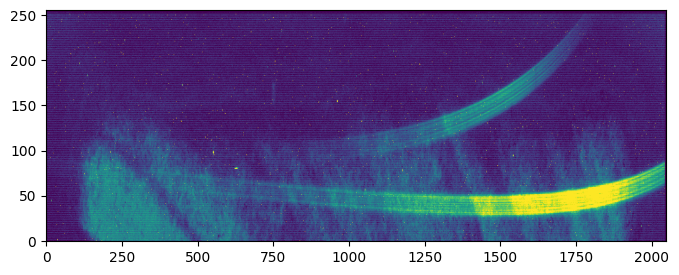

'/data/praxis2/shared_area/jwst/w17/soss/1353_101/stage0/jw01353101001_04101_00001-seg001_nis_uncal.fits'

In [9]:
plot_spectrum(filenames[0])

In [10]:
step = stage1.DQInitStep(filenames, hot_pixel_map=None, output_dir=outdir_s1)

# Now run the step!

results = step.run(save_results=True, force_redo=True)

2025-08-22 10:27:32,939 - stpipe.DQInitStep - INFO - DQInitStep instance created.
2025-08-22 10:27:38,288 - CRDS - INFO -  Calibration SW Found: jwst 1.17.1 (/home/bi19158/Code/soss-data-reduction/venv/lib/python3.10/site-packages/jwst-1.17.1.dist-info)
2025-08-22 10:27:41,107 - stpipe.DQInitStep - INFO - DQInitStep instance created.
2025-08-22 10:27:41,269 - stpipe.DQInitStep - INFO - Step DQInitStep running with args ('/data/praxis2/shared_area/jwst/w17/soss/1353_101/stage0/jw01353101001_04101_00001-seg001_nis_uncal.fits',).
2025-08-22 10:27:41,271 - stpipe.DQInitStep - INFO - Step DQInitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2025-08-22 10:27:55,066 - stpipe.DQInitStep - INFO - Using MASK reference file ./c

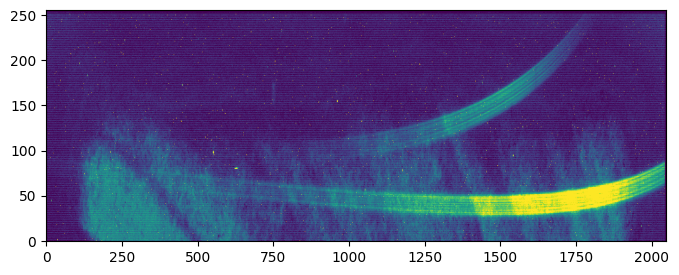

In [11]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg001_nis_dqinitstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e4, vmax=3e4)
    plt.show()

In [12]:

step = stage1.SaturationStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2025-08-22 10:30:23,172 - stpipe.SaturationStep - INFO - SaturationStep instance created.
2025-08-22 10:30:24,850 - stpipe.SaturationStep - INFO - SaturationStep instance created.
2025-08-22 10:30:25,021 - stpipe.SaturationStep - INFO - Step SaturationStep running with args ('/data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/jw01353101001_04101_00001-seg001_nis_dqinitstep.fits',).
2025-08-22 10:30:25,024 - stpipe.SaturationStep - INFO - Step SaturationStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  n_pix_grow_sat: 1
  use_readpatt: True
2025-08-22 10:30:27,219 - stpipe.SaturationStep - INFO - Using SATURATION reference file ./crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits
2025-0

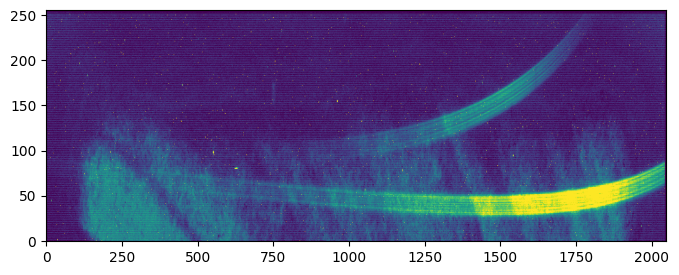

In [13]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg001_nis_saturationstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e4, vmax=3e4)
    plt.show()

In [14]:
saturation_step_files = [
    f"{outdir_s1}{observation_id}_04101_00001-seg001_nis_saturationstep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg002_nis_saturationstep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg003_nis_saturationstep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg004_nis_saturationstep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg005_nis_saturationstep.fits",
]

step = stage1.SuperBiasStep(saturation_step_files, output_dir=outdir_s1)

# This step has options for diagnostic plotting. Specifying do_plot=True will create the step
# plot and save it to the output directory.

results = step.run(save_results=True, force_redo=True, do_plot=True)

2025-08-22 10:33:41,016 - stpipe.SuperBiasStep - INFO - SuperBiasStep instance created.
2025-08-22 10:33:42,518 - stpipe.SuperBiasStep - INFO - SuperBiasStep instance created.
2025-08-22 10:33:42,691 - stpipe.SuperBiasStep - INFO - Step SuperBiasStep running with args ('/data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/jw01353101001_04101_00001-seg001_nis_saturationstep.fits',).
2025-08-22 10:33:42,694 - stpipe.SuperBiasStep - INFO - Step SuperBiasStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2025-08-22 10:33:44,703 - stpipe.SuperBiasStep - INFO - Using SUPERBIAS reference file ./crds_cache/references/jwst/niriss/jwst_niriss_superbias_0200.fits
2025-08-22 10:34:05,541 - stpipe.SuperBiasStep - INFO 

2025-08-22 10:35:12.253 - exoTEDRF - INFO - Doing diagnostic plot.
2025-08-22 10:35:14.264 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/superbiasstep_1.png


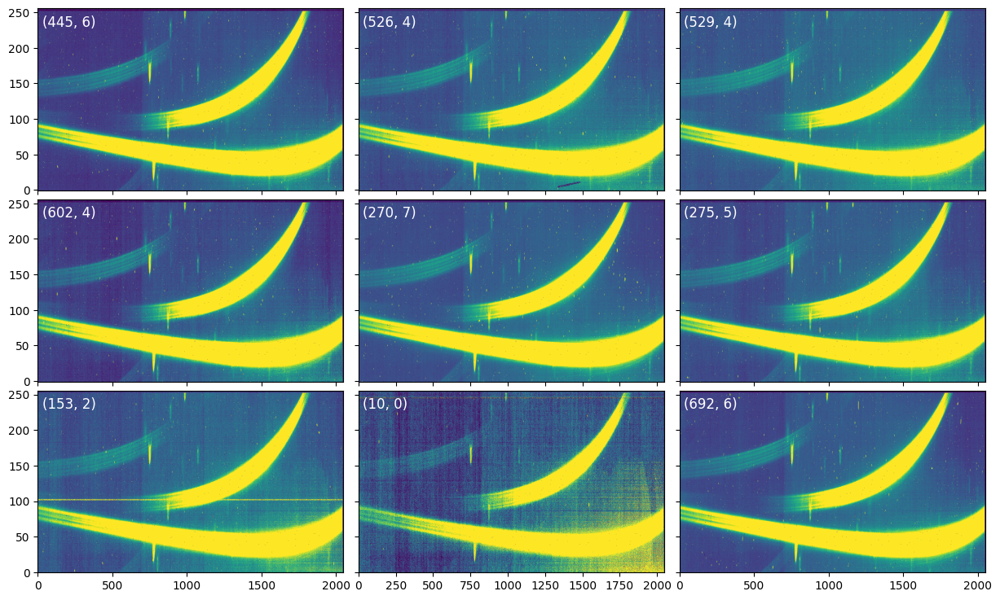

In [15]:
Image(filename=outdir_s1 + 'superbiasstep.png')

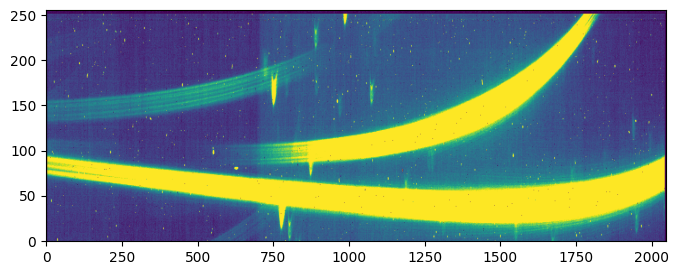

In [16]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg001_nis_superbiasstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e2, vmax=9e2)
    plt.show()

In [17]:
step = stage1.RefPixStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2025-08-22 10:35:14,938 - stpipe.RefPixStep - INFO - RefPixStep instance created.
2025-08-22 10:35:16,475 - stpipe.RefPixStep - INFO - RefPixStep instance created.
2025-08-22 10:35:16,667 - stpipe.RefPixStep - INFO - Step RefPixStep running with args ('/data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/jw01353101001_04101_00001-seg001_nis_superbiasstep.fits',).
2025-08-22 10:35:16,671 - stpipe.RefPixStep - INFO - Step RefPixStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  odd_even_columns: True
  use_side_ref_pixels: True
  side_smoothing_length: 11
  side_gain: 1.0
  odd_even_rows: True
  ovr_corr_mitigation_ftr: 3.0
  preserve_irs2_refpix: False
  irs2_mean_subtraction: False
  refpix_algorithm: me

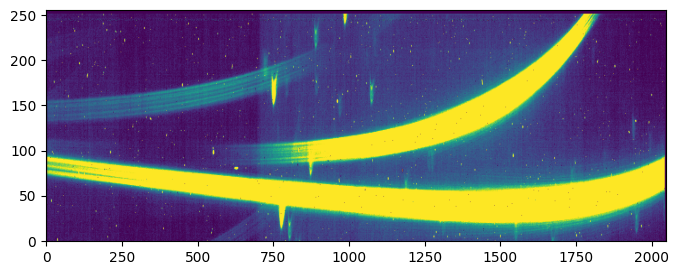

In [18]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg001_nis_refpixstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e2, vmax=9e2)
    plt.show()

In [19]:
step = stage1.DarkCurrentStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2025-08-22 10:36:46,038 - stpipe.DarkCurrentStep - INFO - DarkCurrentStep instance created.
2025-08-22 10:36:47,388 - CRDS - ERROR -  Error determining best reference for 'pars-darkcurrentstep'  =   No match found.
2025-08-22 10:36:47,390 - stpipe.DarkCurrentStep - INFO - DarkCurrentStep instance created.
2025-08-22 10:36:47,574 - stpipe.DarkCurrentStep - INFO - Step DarkCurrentStep running with args ('/data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/jw01353101001_04101_00001-seg001_nis_refpixstep.fits',).
2025-08-22 10:36:47,576 - stpipe.DarkCurrentStep - INFO - Step DarkCurrentStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  dark_output: None
  average_dark_current: None
2025-08-22 10:36:49,434 -

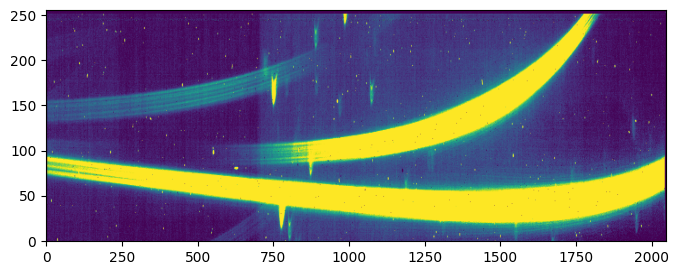

'/data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/jw01353101001_04101_00001-seg001_nis_darkcurrentstep.fits'

In [20]:
plot_spectrum(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg001_nis_darkcurrentstep.fits"), vmin=1e2, vmax=9e2)

In [21]:
background_model = np.load("model_background256.npy")

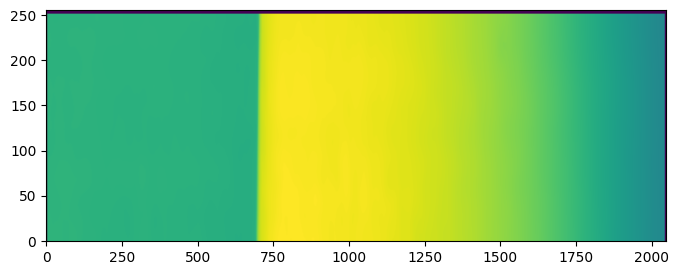

In [22]:
plt.figure(figsize=(8, 3))
plt.imshow(background_model, aspect='auto', origin='lower')
plt.show()

In [23]:
step = stage2.BackgroundStep(results, background_model=background_model,
                             baseline_ints=[150, -100], output_dir=outdir_s1)

results, bkg = step.run(save_results=True, differential=True, force_redo=True, do_plot=True)


2025-08-22 10:37:41.561 - exoTEDRF - INFO - BackgroundStep instance created.
2025-08-22 10:37:41.561 - exoTEDRF - INFO - Creating reference deep stack.


2025-08-22 10:39:42.074 - exoTEDRF - INFO - Starting SOSS background subtraction step.
2025-08-22 10:39:42.074 - exoTEDRF - INFO - Processing file: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/jw01353101001_04101_00001-seg001_nis_darkcurrentstep.fits.
2025-08-22 10:39:42.074 - exoTEDRF - INFO - Calculating background model scaling.
2025-08-22 10:39:42.077 - exoTEDRF - INFO - Using differential background scale factors: 0.00618, 0.74791, and shift: 21.58235
2025-08-22 10:39:42.083 - exoTEDRF - INFO - Using differential background scale factors: 0.13918, 2.40025, and shift: 0.00000
2025-08-22 10:39:42.088 - exoTEDRF - INFO - Using differential background scale factors: 4.64480, 6.87248, and shift: 0.00000
2025-08-22 10:39:42.094 - exoTEDRF - INFO - Using differential background scale factors: 9.36037, 11.08444, and shift: 0.00000
2025-08-22 10:39:42.100 - exoTEDRF - INFO - Using differential background scale factors: 13.96361, 15.53349, and shift: 0.00000
2025-08-2

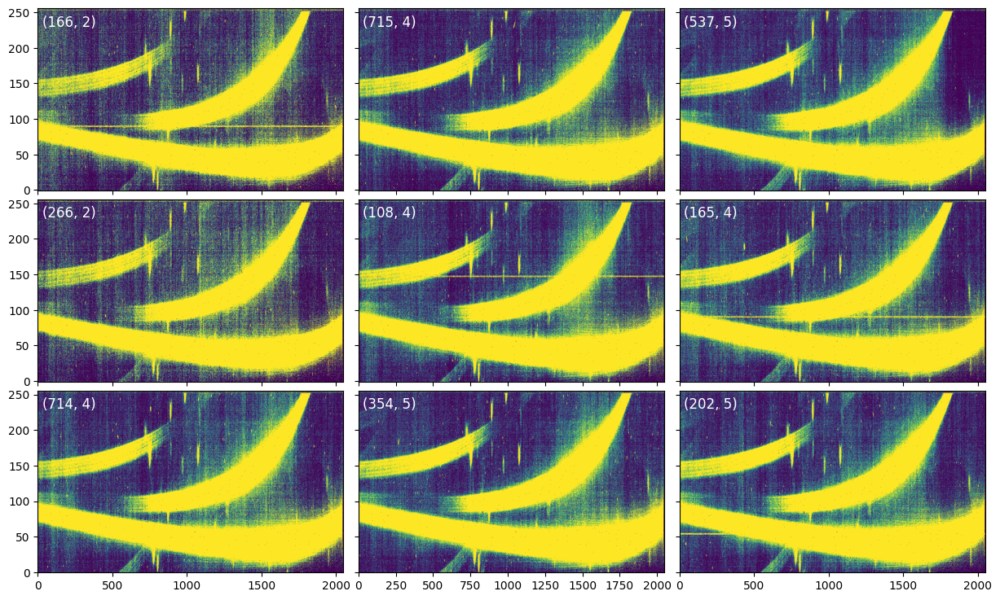

In [24]:
Image(filename=outdir_s1 + 'backgroundstep_1.png')

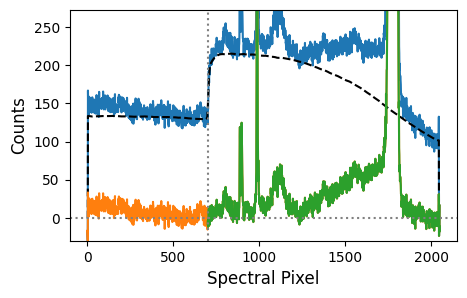

In [25]:
Image(filename=outdir_s1 + 'backgroundstep_2.png')

In [26]:
pixel_masks = None
timeseries = None

background_step_files = [
    f"{outdir_s1}{observation_id}_04101_00001-seg001_nis_backgroundstep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg002_nis_backgroundstep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg003_nis_backgroundstep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg004_nis_backgroundstep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg005_nis_backgroundstep.fits",
]

step = stage1.OneOverFStep(background_step_files, baseline_ints=[150, -100], output_dir=outdir_s1,
                           pixel_masks=pixel_masks, soss_timeseries=timeseries,
                           method='scale-achromatic', soss_background=bkg)
results = step.run(save_results=True, even_odd_rows=True, force_redo=True, do_plot=True,
                   soss_inner_mask_width=40, smoothing_scale=2)

2025-08-22 10:41:37.182 - exoTEDRF - INFO - OneOverFStep instance created.
2025-08-22 10:41:37.183 - exoTEDRF - INFO - Creating reference deep stack.


2025-08-22 10:43:36,258 - stpipe.Extract1dStep - INFO - Extract1dStep instance created.


2025-08-22 10:43:36.254 - exoTEDRF - INFO - No centroids provided, locating trace positions.
2025-08-22 10:43:38.546 - exoTEDRF - INFO - Starting 1/f correction step using the scale-achromatic method.
2025-08-22 10:43:38.553 - exoTEDRF - INFO - Processing file jw01353101001_04101_00001-seg001_nis_backgroundstep.fits.
2025-08-22 10:43:38.553 - exoTEDRF - INFO - Unpacking centroids.
2025-08-22 10:43:38.553 - exoTEDRF - WARNING - No outlier maps passed, ignoring outliers.
2025-08-22 10:43:38.649 - exoTEDRF - INFO - Constructing trace mask.
2025-08-22 10:43:38.762 - exoTEDRF - INFO - Flagging additional outliers.
2025-08-22 10:44:17.052 - exoTEDRF - WARNING - No timeseries passed. It will be estimated from current data.
2025-08-22 10:44:17.054 - exoTEDRF - INFO - Smoothing self-calibrated timeseries on a scale of 2 integrations.
2025-08-22 10:44:17.054 - exoTEDRF - INFO - Starting full frame correction.


100%|██████████| 178/178 [00:15<00:00, 11.42it/s]


2025-08-22 10:44:41.139 - exoTEDRF - INFO - File saved to: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/jw01353101001_04101_00001-seg001_nis_oneoverfstep.fits.
2025-08-22 10:44:41.816 - exoTEDRF - INFO - Starting 1/f correction step using the scale-achromatic method.
2025-08-22 10:44:41.821 - exoTEDRF - INFO - Processing file jw01353101001_04101_00001-seg002_nis_backgroundstep.fits.
2025-08-22 10:44:41.821 - exoTEDRF - INFO - Unpacking centroids.
2025-08-22 10:44:41.821 - exoTEDRF - WARNING - No outlier maps passed, ignoring outliers.
2025-08-22 10:44:41.915 - exoTEDRF - INFO - Constructing trace mask.
2025-08-22 10:44:42.028 - exoTEDRF - INFO - Flagging additional outliers.
2025-08-22 10:45:20.499 - exoTEDRF - WARNING - No timeseries passed. It will be estimated from current data.
2025-08-22 10:45:20.502 - exoTEDRF - INFO - Smoothing self-calibrated timeseries on a scale of 2 integrations.
2025-08-22 10:45:20.502 - exoTEDRF - INFO - Starting full frame correctio

100%|██████████| 178/178 [00:15<00:00, 11.52it/s]


2025-08-22 10:45:44.583 - exoTEDRF - INFO - File saved to: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/jw01353101001_04101_00001-seg002_nis_oneoverfstep.fits.
2025-08-22 10:45:45.008 - exoTEDRF - INFO - Starting 1/f correction step using the scale-achromatic method.
2025-08-22 10:45:45.013 - exoTEDRF - INFO - Processing file jw01353101001_04101_00001-seg003_nis_backgroundstep.fits.
2025-08-22 10:45:45.013 - exoTEDRF - INFO - Unpacking centroids.
2025-08-22 10:45:45.013 - exoTEDRF - WARNING - No outlier maps passed, ignoring outliers.
2025-08-22 10:45:45.108 - exoTEDRF - INFO - Constructing trace mask.
2025-08-22 10:45:45.220 - exoTEDRF - INFO - Flagging additional outliers.
2025-08-22 10:46:23.669 - exoTEDRF - WARNING - No timeseries passed. It will be estimated from current data.
2025-08-22 10:46:23.671 - exoTEDRF - INFO - Smoothing self-calibrated timeseries on a scale of 2 integrations.
2025-08-22 10:46:23.672 - exoTEDRF - INFO - Starting full frame correctio

100%|██████████| 178/178 [00:15<00:00, 11.54it/s]


2025-08-22 10:46:47.637 - exoTEDRF - INFO - File saved to: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/jw01353101001_04101_00001-seg003_nis_oneoverfstep.fits.
2025-08-22 10:46:48.050 - exoTEDRF - INFO - Starting 1/f correction step using the scale-achromatic method.
2025-08-22 10:46:48.055 - exoTEDRF - INFO - Processing file jw01353101001_04101_00001-seg004_nis_backgroundstep.fits.
2025-08-22 10:46:48.055 - exoTEDRF - INFO - Unpacking centroids.
2025-08-22 10:46:48.055 - exoTEDRF - WARNING - No outlier maps passed, ignoring outliers.
2025-08-22 10:46:48.149 - exoTEDRF - INFO - Constructing trace mask.
2025-08-22 10:46:48.262 - exoTEDRF - INFO - Flagging additional outliers.
2025-08-22 10:47:26.692 - exoTEDRF - WARNING - No timeseries passed. It will be estimated from current data.
2025-08-22 10:47:26.695 - exoTEDRF - INFO - Smoothing self-calibrated timeseries on a scale of 2 integrations.
2025-08-22 10:47:26.695 - exoTEDRF - INFO - Starting full frame correctio

100%|██████████| 178/178 [00:15<00:00, 11.42it/s]


2025-08-22 10:47:50.963 - exoTEDRF - INFO - File saved to: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/jw01353101001_04101_00001-seg004_nis_oneoverfstep.fits.
2025-08-22 10:47:51.370 - exoTEDRF - INFO - Starting 1/f correction step using the scale-achromatic method.
2025-08-22 10:47:51.375 - exoTEDRF - INFO - Processing file jw01353101001_04101_00001-seg005_nis_backgroundstep.fits.
2025-08-22 10:47:51.375 - exoTEDRF - INFO - Unpacking centroids.
2025-08-22 10:47:51.375 - exoTEDRF - WARNING - No outlier maps passed, ignoring outliers.
2025-08-22 10:47:51.380 - exoTEDRF - INFO - Constructing trace mask.
2025-08-22 10:47:51.405 - exoTEDRF - INFO - Flagging additional outliers.
2025-08-22 10:47:51.730 - exoTEDRF - WARNING - No timeseries passed. It will be estimated from current data.
2025-08-22 10:47:51.730 - exoTEDRF - INFO - Smoothing self-calibrated timeseries on a scale of 2 integrations.
2025-08-22 10:47:51.731 - exoTEDRF - INFO - Starting full frame correctio

100%|██████████| 8/8 [00:00<00:00, 11.34it/s]


2025-08-22 10:47:52.842 - exoTEDRF - INFO - File saved to: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/jw01353101001_04101_00001-seg005_nis_oneoverfstep.fits.
2025-08-22 10:49:53.475 - exoTEDRF - INFO - Doing diagnostic plot 1.
2025-08-22 10:49:55.183 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/oneoverfstep_1.png
2025-08-22 10:49:55.184 - exoTEDRF - INFO - Doing diagnostic plot 2.
2025-08-22 10:50:45.509 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/oneoverfstep_2.png
2025-08-22 10:50:45.509 - exoTEDRF - INFO - Step OneOverFStep done.


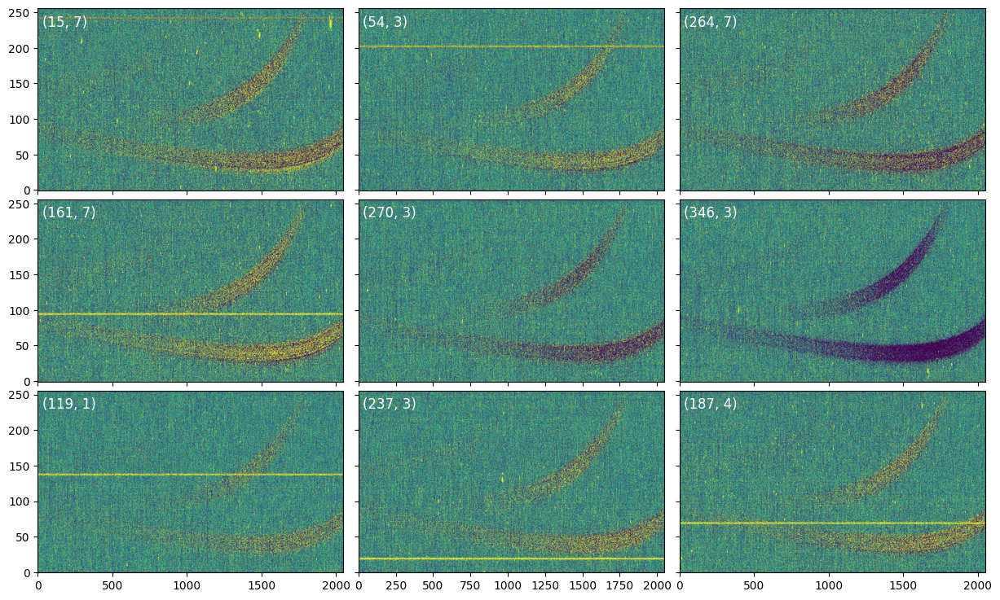

In [27]:
Image(filename=outdir_s1 + 'oneoverfstep_1.png')

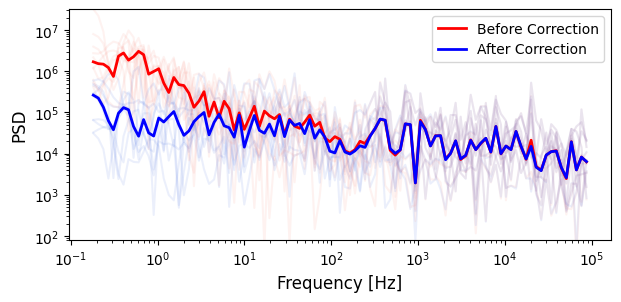

In [28]:
Image(filename=outdir_s1 + 'oneoverfstep_2.png')


In [29]:
step = stage1.LinearityStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True, do_plot=True)

2025-08-22 10:50:45,653 - stpipe.LinearityStep - INFO - LinearityStep instance created.
2025-08-22 10:50:47,308 - stpipe.LinearityStep - INFO - LinearityStep instance created.
2025-08-22 10:50:47,546 - stpipe.LinearityStep - INFO - Step LinearityStep running with args ('/data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/jw01353101001_04101_00001-seg001_nis_oneoverfstep.fits',).
2025-08-22 10:50:47,549 - stpipe.LinearityStep - INFO - Step LinearityStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2025-08-22 10:50:49,334 - stpipe.LinearityStep - INFO - Using Linearity reference file ./crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits
2025-08-22 10:50:49,410 - stpipe.LinearityStep - WARNING

2025-08-22 10:54:15.556 - exoTEDRF - INFO - Doing diagnostic plot 1.
2025-08-22 10:54:17.120 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/linearitystep_1.png
2025-08-22 10:54:17.157 - exoTEDRF - INFO - Doing diagnostic plot 2.
2025-08-22 10:54:54.574 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/linearitystep_2.png


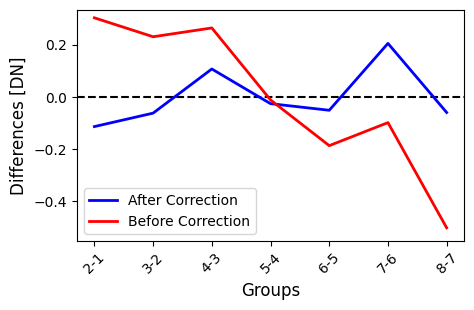

In [30]:
Image(filename=outdir_s1 + 'linearitystep_1.png')



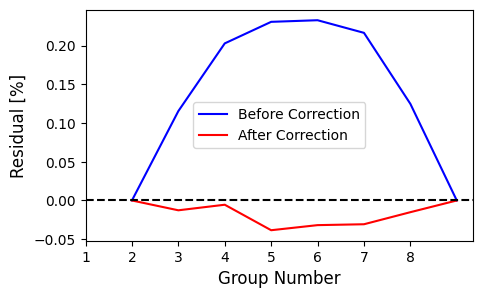

In [31]:
Image(filename=outdir_s1 + 'linearitystep_2.png')



In [32]:
# linearity_step_files = [
#     f"{outdir_s1}{observation_id}_04101_00001-seg001_nis_linearitystep.fits",
#     f"{outdir_s1}{observation_id}_04101_00001-seg002_nis_linearitystep.fits",
#     f"{outdir_s1}{observation_id}_04101_00001-seg003_nis_linearitystep.fits",
#     f"{outdir_s1}{observation_id}_04101_00001-seg004_nis_linearitystep.fits",
#     f"{outdir_s1}{observation_id}_04101_00001-seg005_nis_linearitystep.fits",
# ]

step = stage1.JumpStep(results, output_dir=outdir_s1)
results = step.run(save_results=True, force_redo=True, flag_in_time=True,
                   time_rejection_threshold=7, do_plot=True)

2025-08-22 10:54:54.878 - exoTEDRF - INFO - Starting time-domain jump detection step.
2025-08-22 10:54:54.882 - exoTEDRF - INFO - Processing file jw01353101001_04101_00001-seg001_nis_linearitystep.fits.


  0%|          | 0/8 [00:00<?, ?it/s]

100%|██████████| 8/8 [18:00<00:00, 135.12s/it]


2025-08-22 11:12:55.998 - exoTEDRF - INFO - 853938 jumps flagged
2025-08-22 11:12:55.998 - exoTEDRF - INFO - and 0 interpolated
2025-08-22 11:13:03.363 - exoTEDRF - INFO - Done
2025-08-22 11:13:03.742 - exoTEDRF - INFO - Starting time-domain jump detection step.
2025-08-22 11:13:03.746 - exoTEDRF - INFO - Processing file jw01353101001_04101_00001-seg002_nis_linearitystep.fits.


100%|██████████| 8/8 [17:57<00:00, 134.73s/it]


2025-08-22 11:31:01.745 - exoTEDRF - INFO - 871278 jumps flagged
2025-08-22 11:31:01.745 - exoTEDRF - INFO - and 0 interpolated
2025-08-22 11:31:09.120 - exoTEDRF - INFO - Done
2025-08-22 11:31:09.485 - exoTEDRF - INFO - Starting time-domain jump detection step.
2025-08-22 11:31:09.490 - exoTEDRF - INFO - Processing file jw01353101001_04101_00001-seg003_nis_linearitystep.fits.


100%|██████████| 8/8 [17:57<00:00, 134.75s/it]


2025-08-22 11:49:07.577 - exoTEDRF - INFO - 833905 jumps flagged
2025-08-22 11:49:07.577 - exoTEDRF - INFO - and 0 interpolated
2025-08-22 11:49:14.941 - exoTEDRF - INFO - Done
2025-08-22 11:49:15.301 - exoTEDRF - INFO - Starting time-domain jump detection step.
2025-08-22 11:49:15.305 - exoTEDRF - INFO - Processing file jw01353101001_04101_00001-seg004_nis_linearitystep.fits.


100%|██████████| 8/8 [18:15<00:00, 136.97s/it]


2025-08-22 12:07:31.181 - exoTEDRF - INFO - 833835 jumps flagged
2025-08-22 12:07:31.181 - exoTEDRF - INFO - and 0 interpolated
2025-08-22 12:07:38.790 - exoTEDRF - INFO - Done
2025-08-22 12:07:39.139 - exoTEDRF - INFO - Starting time-domain jump detection step.
2025-08-22 12:07:39.143 - exoTEDRF - INFO - Processing file jw01353101001_04101_00001-seg005_nis_linearitystep.fits.


100%|██████████| 8/8 [00:34<00:00,  4.37s/it]


2025-08-22 12:08:14.120 - exoTEDRF - INFO - 93640 jumps flagged
2025-08-22 12:08:14.120 - exoTEDRF - INFO - and 0 interpolated
2025-08-22 12:08:14.491 - exoTEDRF - INFO - Done
2025-08-22 12:08:14.513 - exoTEDRF - INFO - Doing diagnostic plot.
2025-08-22 12:11:25.398 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/jump.png
2025-08-22 12:11:25.399 - exoTEDRF - INFO - Step JumpStep done.


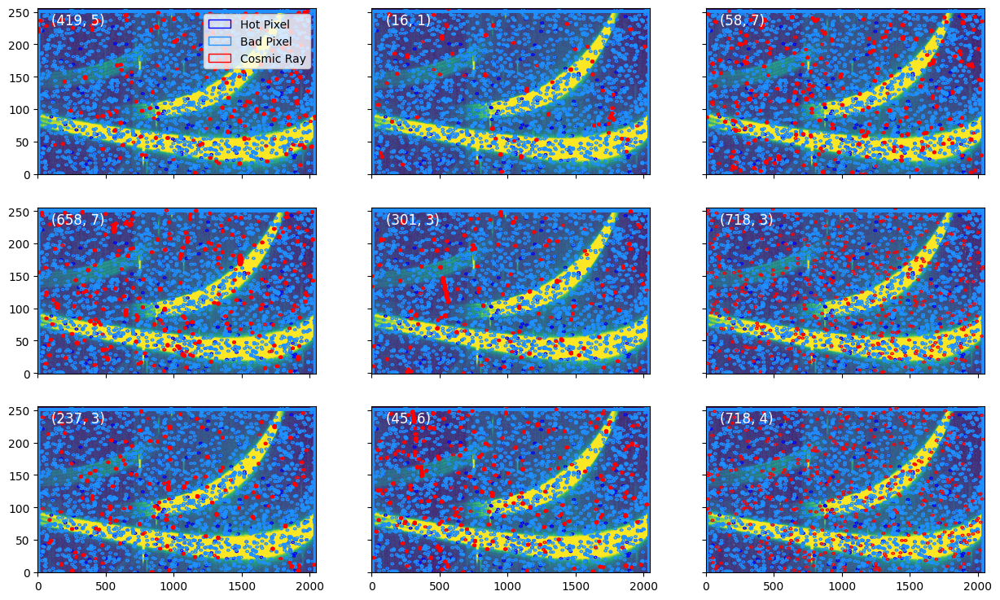

In [33]:
Image(filename=outdir_s1 + 'jump.png')

In [34]:
step = stage1.RampFitStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2025-08-22 12:11:25,545 - stpipe.RampFitStep - INFO - RampFitStep instance created.


2025-08-22 12:11:27,091 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-22 12:11:30,658 - stpipe.RampFitStep - INFO - Step RampFitStep running with args ('/data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/jw01353101001_04101_00001-seg001_nis_jump.fits',).
2025-08-22 12:11:30,662 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  algorithm: OLS_C
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-22 12:11:33,510 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits
2025-08-22 12:11:33,511 - stpipe.RampFitStep -

2025-08-22 12:12:56.967 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.


2025-08-22 12:14:35,155 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-22 12:14:36,585 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-22 12:14:36,768 - stpipe.RampFitStep - INFO - Step RampFitStep running with args ('/data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/jw01353101001_04101_00001-seg002_nis_jump.fits',).
2025-08-22 12:14:36,771 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  algorithm: OLS_C
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-22 12:14:39,611 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/n

2025-08-22 12:15:01.025 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.


2025-08-22 12:16:39,610 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-22 12:16:41,048 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-22 12:16:41,231 - stpipe.RampFitStep - INFO - Step RampFitStep running with args ('/data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/jw01353101001_04101_00001-seg003_nis_jump.fits',).
2025-08-22 12:16:41,234 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  algorithm: OLS_C
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-22 12:16:44,093 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/n

2025-08-22 12:17:05.540 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.


2025-08-22 12:18:44,005 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-22 12:18:45,544 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-22 12:18:45,729 - stpipe.RampFitStep - INFO - Step RampFitStep running with args ('/data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/jw01353101001_04101_00001-seg004_nis_jump.fits',).
2025-08-22 12:18:45,732 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  algorithm: OLS_C
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-22 12:18:48,700 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/n

2025-08-22 12:19:10.098 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.


2025-08-22 12:20:48,688 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-22 12:20:48,945 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-22 12:20:49,122 - stpipe.RampFitStep - INFO - Step RampFitStep running with args ('/data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/jw01353101001_04101_00001-seg005_nis_jump.fits',).
2025-08-22 12:20:49,125 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  algorithm: OLS_C
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-22 12:20:49,483 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/n

2025-08-22 12:20:51.556 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.
2025-08-22 12:20:56.608 - exoTEDRF - INFO - Step RampFitStep really done.


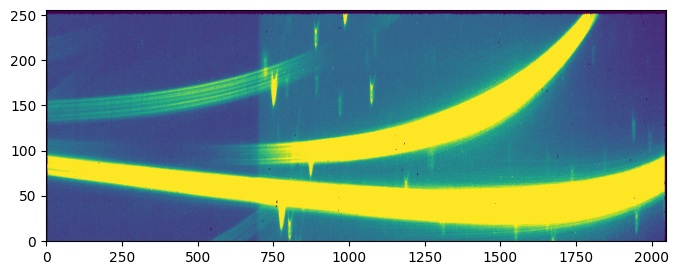

In [35]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg003_nis_rampfitstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    plt.imshow(file[1].data[0], aspect='auto', origin='lower', vmin=1, vmax=16)
    plt.show()

In [36]:
step = stage1.GainScaleStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)



2025-08-22 12:20:56,870 - stpipe.GainScaleStep - INFO - GainScaleStep instance created.
2025-08-22 12:20:57,600 - stpipe.GainScaleStep - INFO - GainScaleStep instance created.
2025-08-22 12:20:57,786 - stpipe.GainScaleStep - INFO - Step GainScaleStep running with args ('/data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/jw01353101001_04101_00001-seg001_nis_rampfitstep.fits',).
2025-08-22 12:20:57,788 - stpipe.GainScaleStep - INFO - Step GainScaleStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2025-08-22 12:20:58,687 - stpipe.GainScaleStep - INFO - GAINFACT not found in gain reference file
2025-08-22 12:20:58,687 - stpipe.GainScaleStep - INFO - Step will be skipped
2025-08-22 12:20:58,691 - stpipe.Gain

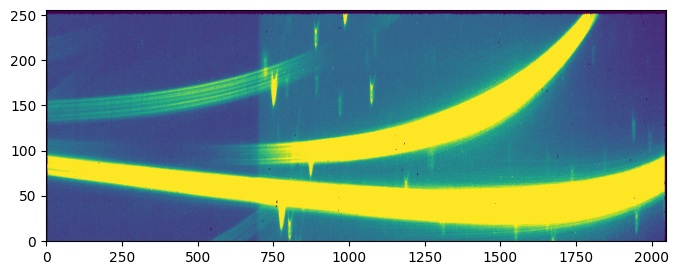

In [37]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg003_nis_gainscalestep.fits")) as file:
    plt.figure(figsize=(8, 3))
    plt.imshow(file[1].data[0], aspect='auto', origin='lower', vmin=1, vmax=16)
    plt.show()